In [1]:
from google.colab import drive
drive.mount('/content/drive')

# Week 2 folder setup
import os

BASE_DIR = '/content/drive/MyDrive/CSE499A_Project'
W1_DIR   = os.path.join(BASE_DIR, 'Week1')
W2_DIR   = os.path.join(BASE_DIR, 'Week2')
RESULTS_DIR = os.path.join(W2_DIR, 'results')

os.makedirs(W1_DIR, exist_ok=True)
os.makedirs(W2_DIR, exist_ok=True)
os.makedirs(RESULTS_DIR, exist_ok=True)

print("✅ Drive mounted and folders ready:")
print(W2_DIR)


Mounted at /content/drive
✅ Drive mounted and folders ready:
/content/drive/MyDrive/CSE499A_Project/Week2


In [2]:
!pip install -q diffusers transformers accelerate torch torchvision pillow scikit-image opencv-python pandas matplotlib


In [3]:
import cv2
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime
from PIL import Image
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr


In [4]:
from diffusers import StableDiffusionInpaintPipeline
import torch

model_path = os.path.join(W1_DIR, "inpaint_model")  # path where Week1 model was saved
if not os.path.exists(model_path):
    # fallback to pretrained if not found
    model_path = "runwayml/stable-diffusion-inpainting"

pipe = StableDiffusionInpaintPipeline.from_pretrained(model_path, torch_dtype=torch.float16)
pipe = pipe.to("cuda")

print("✅ Model ready:", model_path)


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/548 [00:00<?, ?B/s]

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

config.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/748 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

scheduler_config.json:   0%|          | 0.00/313 [00:00<?, ?B/s]

safety_checker/pytorch_model.bin:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

text_encoder/pytorch_model.bin:   0%|          | 0.00/492M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/552 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.bin:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.bin:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

An error occurred while trying to fetch /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
An error occurred while trying to fetch /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
`torch_dtype` is deprecated! Use `dtype` instead!


✅ Model ready: runwayml/stable-diffusion-inpainting


In [5]:
def run_inpainting(model, image, mask, prompt, num_steps=50, guidance_scale=7.5):
    """
    Runs the inpainting diffusion pipeline.
    image, mask: uint8 RGB arrays
    """
    image_pil = Image.fromarray(image)
    mask_pil = Image.fromarray(mask)

    result = model(
        prompt=prompt,
        image=image_pil,
        mask_image=mask_pil,
        num_inference_steps=num_steps,
        guidance_scale=guidance_scale
    ).images[0]

    return np.array(result)


In [6]:
class MaskPainter:
    def __init__(self, image):
        self.img = image.copy()
        self.mask = np.zeros(self.img.shape[:2], dtype=np.uint8)
        self.brush_size = 20
        self.drawing = False
        cv2.namedWindow("Draw Mask")
        cv2.setMouseCallback("Draw Mask", self.draw_callback)

    def draw_callback(self, event, x, y, flags, param):
        if event == cv2.EVENT_LBUTTONDOWN:
            self.drawing = True
            cv2.circle(self.mask, (x, y), self.brush_size, 255, -1)
        elif event == cv2.EVENT_MOUSEMOVE and self.drawing:
            cv2.circle(self.mask, (x, y), self.brush_size, 255, -1)
        elif event == cv2.EVENT_LBUTTONUP:
            self.drawing = False
            cv2.circle(self.mask, (x, y), self.brush_size, 255, -1)

    def run(self):
        while True:
            overlay = self.img.copy()
            overlay[self.mask > 0] = (255, 0, 0)
            cv2.imshow("Draw Mask", cv2.cvtColor(overlay, cv2.COLOR_RGB2BGR))
            key = cv2.waitKey(1) & 0xFF
            if key == ord('+'): self.brush_size += 5
            elif key == ord('-'): self.brush_size = max(5, self.brush_size - 5)
            elif key in [ord('q'), 27]: break
        cv2.destroyWindow("Draw Mask")
        return self.mask


In [7]:
def refine_mask(binary_mask, kernel_size=7, iterations=1):
    if binary_mask.max() == 255:
        m = (binary_mask > 127).astype(np.uint8)
    else:
        m = binary_mask.copy().astype(np.uint8)
    kernel = np.ones((kernel_size, kernel_size), np.uint8)
    closed = cv2.morphologyEx(m, cv2.MORPH_CLOSE, kernel, iterations=iterations)
    dilated = cv2.dilate(closed, kernel, iterations=1)
    return dilated


In [8]:
def visualize_triplet(orig, mask, inpainted, save_path=None, title=None):
    if mask.ndim == 2:
        mask_vis = np.stack([mask*255]*3, axis=-1).astype(np.uint8)
    else:
        mask_vis = (mask*255).astype(np.uint8)

    fig, axes = plt.subplots(1, 3, figsize=(15,5))
    axes[0].imshow(orig); axes[0].set_title("Original"); axes[0].axis("off")
    axes[1].imshow(mask_vis); axes[1].set_title("Mask"); axes[1].axis("off")
    axes[2].imshow(inpainted); axes[2].set_title("Inpainted"); axes[2].axis("off")
    if title: fig.suptitle(title, fontsize=14)
    plt.tight_layout()
    if save_path: fig.savefig(save_path, dpi=200, bbox_inches='tight')
    plt.show()


In [9]:
def compute_metrics(gt_img, pred_img, mask=None):
    gt_f = gt_img.astype(np.float32) / 255.0
    pred_f = pred_img.astype(np.float32) / 255.0

    ssim_full = ssim(gt_f, pred_f, data_range=1.0, channel_axis=2)
    psnr_full = psnr(gt_f, pred_f, data_range=1.0)
    out = {"psnr_full": psnr_full, "ssim_full": ssim_full}

    if mask is not None:
        m = (mask > 127).astype(np.uint8)
        m3 = np.repeat(m[..., None], 3, axis=2)
        gt_region = gt_f[m3 == 1].reshape(-1,3)
        pred_region = pred_f[m3 == 1].reshape(-1,3)
        if gt_region.size > 0:
            mse_region = np.mean((gt_region - pred_region) ** 2)
            psnr_region = 10.0 * np.log10(1.0 / (mse_region + 1e-8))
            ys, xs = np.where(m>0)
            y1,y2,x1,x2 = ys.min(), ys.max(), xs.min(), xs.max()
            ssim_region = ssim(gt_f[y1:y2+1,x1:x2+1,:], pred_f[y1:y2+1,x1:x2+1,:], data_range=1.0, channel_axis=2)
            out["psnr_mask_region"] = psnr_region
            out["ssim_mask_region"] = ssim_region
    return out


In [10]:
def run_experiments(model, orig_img_uint8, mask_uint8, prompts, num_steps_list, guidance_list):
    records = []
    for prompt in prompts:
        for steps in num_steps_list:
            for guidance in guidance_list:
                inpainted = run_inpainting(model, orig_img_uint8, mask_uint8, prompt, steps, guidance)
                metrics = compute_metrics(orig_img_uint8, inpainted, mask_uint8)
                tag = f"{datetime.now().strftime('%Y%m%d_%H%M%S')}_s{steps}_g{guidance}"
                panel_path = os.path.join(RESULTS_DIR, f"panel_{tag}.png")
                title = f"prompt='{prompt}' | steps={steps} | guidance={guidance}"
                visualize_triplet(orig_img_uint8, mask_uint8, inpainted, panel_path, title)
                rec = {"prompt": prompt, "steps": steps, "guidance": guidance, "panel": panel_path, **metrics}
                records.append(rec)
                pd.DataFrame(records).to_csv(os.path.join(RESULTS_DIR, "summary.csv"), index=False)
    return pd.DataFrame(records)


In [15]:
!pip install -q gdown

import os

# folders (same as before)
BASE_DIR = '/content/drive/MyDrive/CSE499A_Project'
IMG_DIR = os.path.join(BASE_DIR, 'sample_images')
os.makedirs(IMG_DIR, exist_ok=True)

# Google Drive file ID from your link:
# https://drive.google.com/file/d/1519YVn8foiFNpcchSXpyzEyJJ6BFMw4K/view?usp=drive_link
FILE_ID = "1519YVn8foiFNpcchSXpyzEyJJ6BFMw4K"

# where we will save it in Drive
LOCAL_IMG_PATH = os.path.join(IMG_DIR, "sample1.png")

# download using gdown
!gdown --id $FILE_ID -O "$LOCAL_IMG_PATH"

print("✅ Downloaded to:", LOCAL_IMG_PATH)
print("Exists?", os.path.exists(LOCAL_IMG_PATH))


/usr/local/lib/python3.12/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1519YVn8foiFNpcchSXpyzEyJJ6BFMw4K
To: /content/drive/MyDrive/CSE499A_Project/sample_images/sample1.png
100% 391k/391k [00:00<00:00, 18.3MB/s]
✅ Downloaded to: /content/drive/MyDrive/CSE499A_Project/sample_images/sample1.png
Exists? True


✅ Loaded orig_img with shape: (512, 512, 3)


  0%|          | 0/30 [00:00<?, ?it/s]

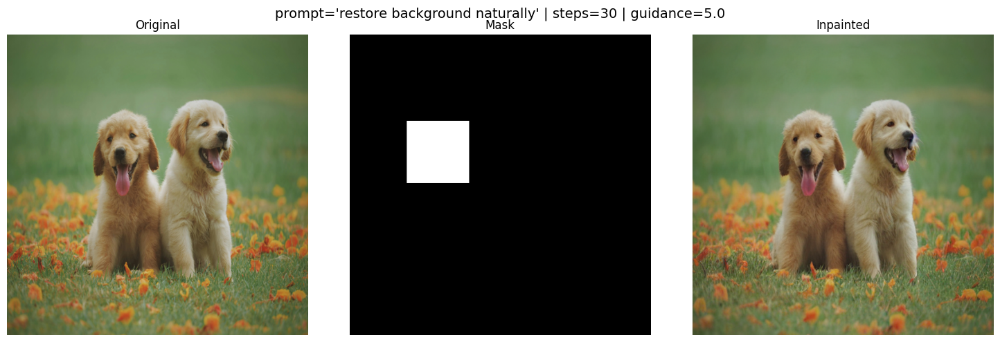

  0%|          | 0/30 [00:00<?, ?it/s]

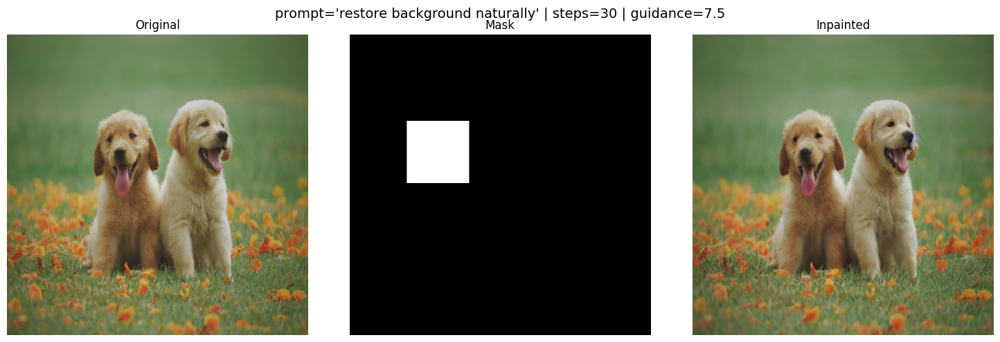

  0%|          | 0/30 [00:00<?, ?it/s]

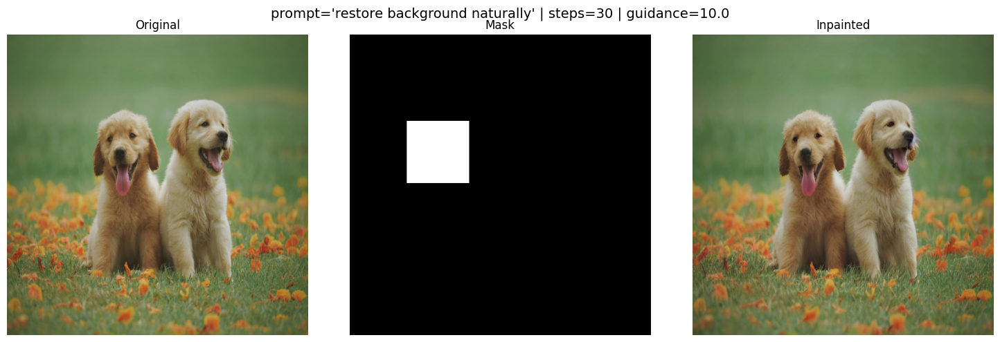

  0%|          | 0/50 [00:00<?, ?it/s]

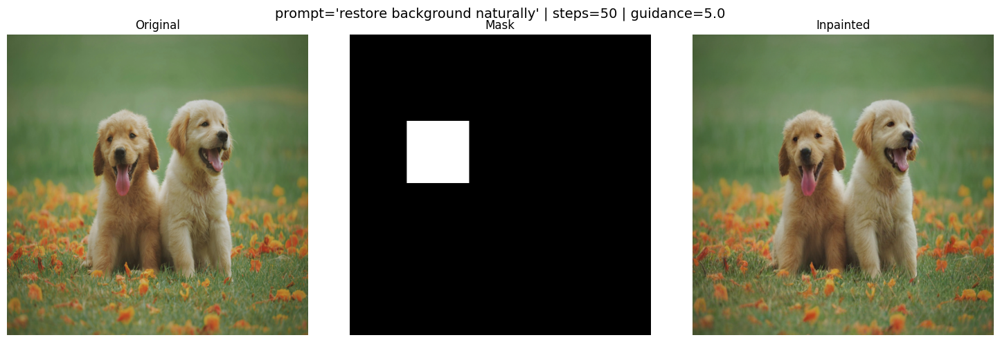

  0%|          | 0/50 [00:00<?, ?it/s]

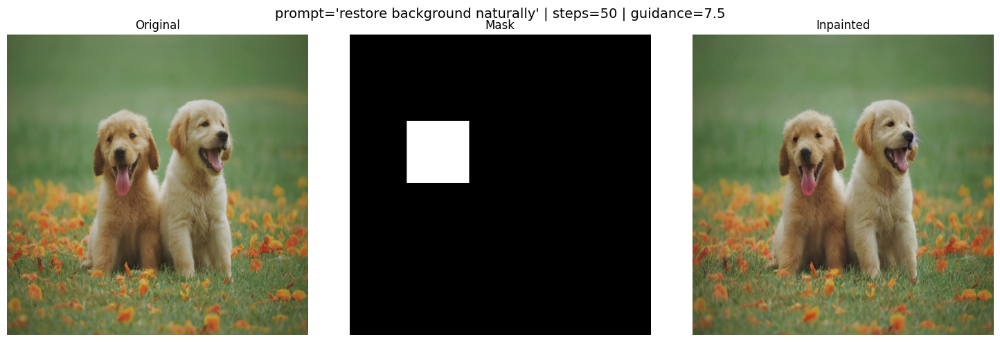

  0%|          | 0/50 [00:00<?, ?it/s]

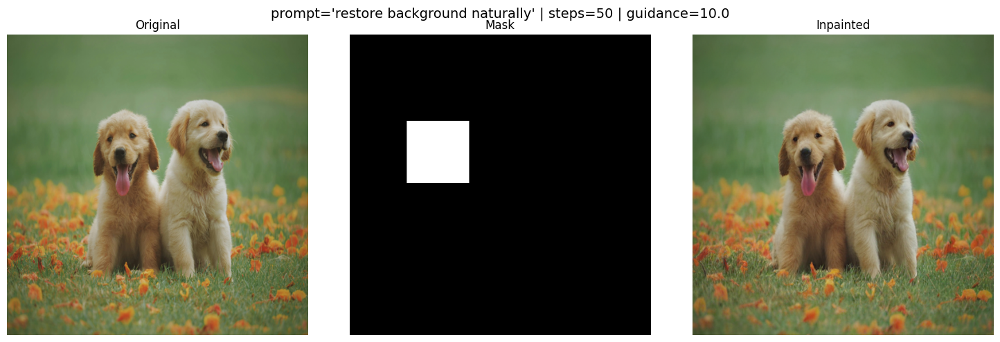

  0%|          | 0/30 [00:00<?, ?it/s]

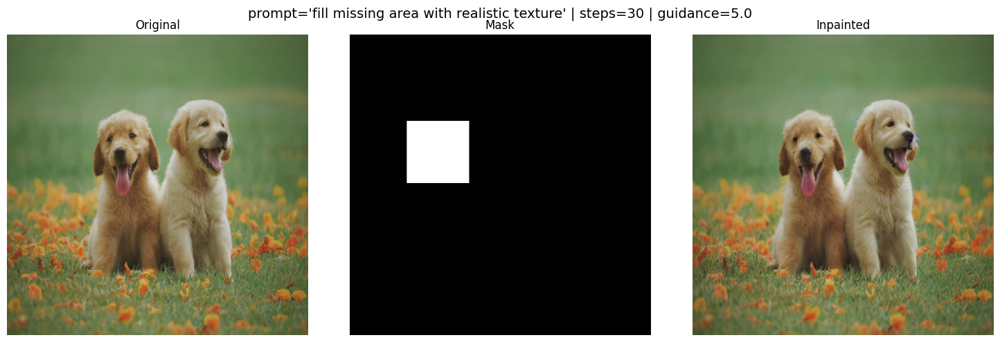

  0%|          | 0/30 [00:00<?, ?it/s]

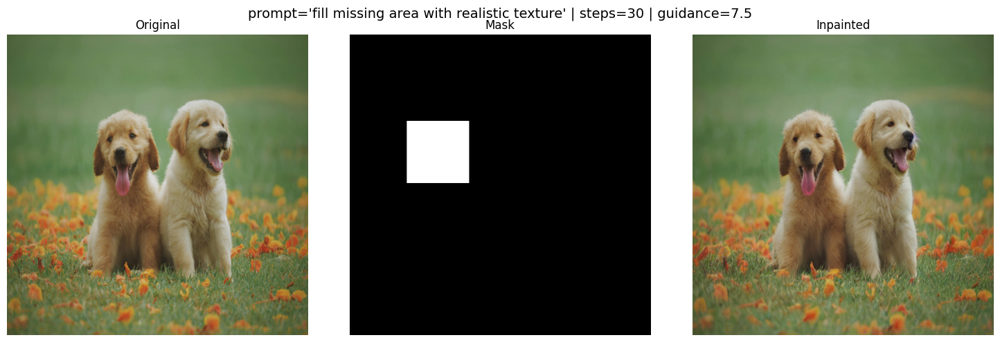

  0%|          | 0/30 [00:00<?, ?it/s]

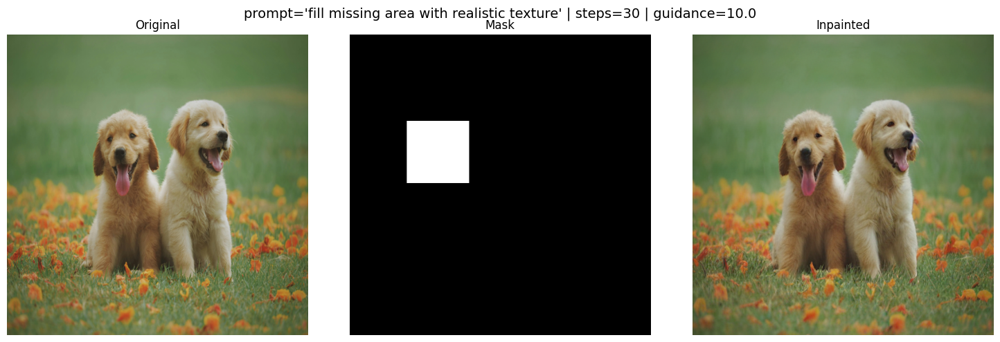

  0%|          | 0/50 [00:00<?, ?it/s]

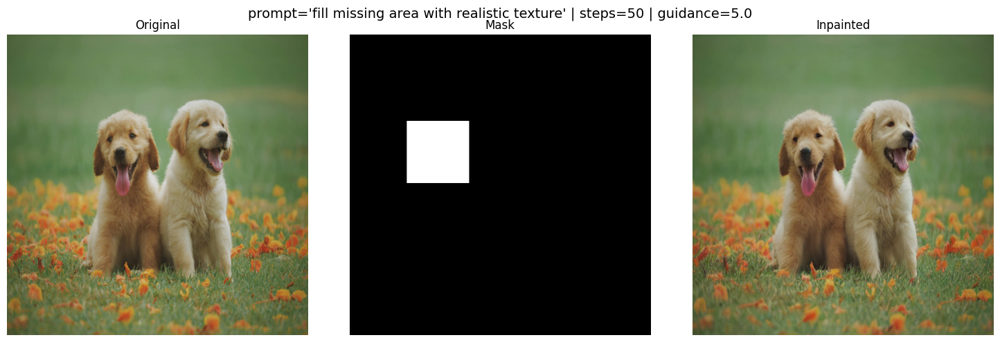

  0%|          | 0/50 [00:00<?, ?it/s]

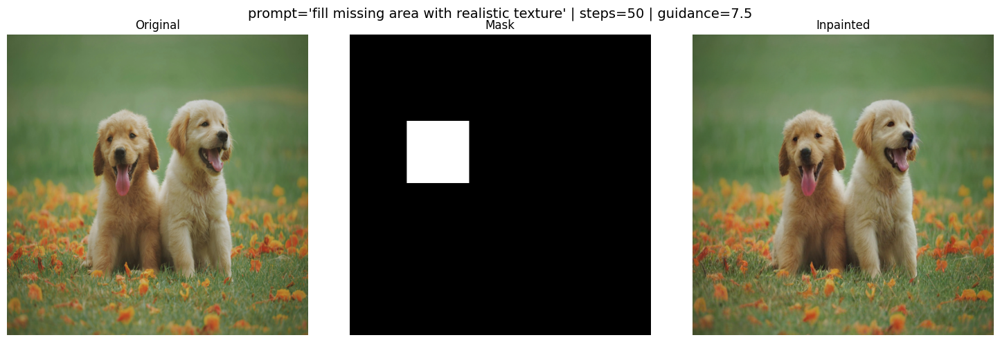

  0%|          | 0/50 [00:00<?, ?it/s]

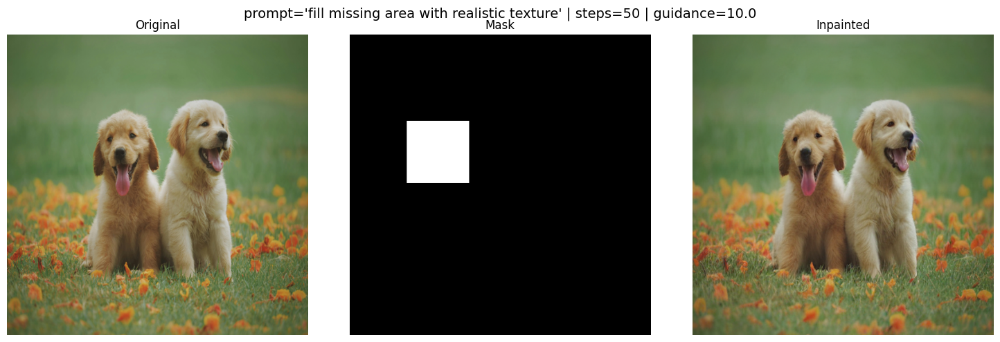

  0%|          | 0/30 [00:00<?, ?it/s]

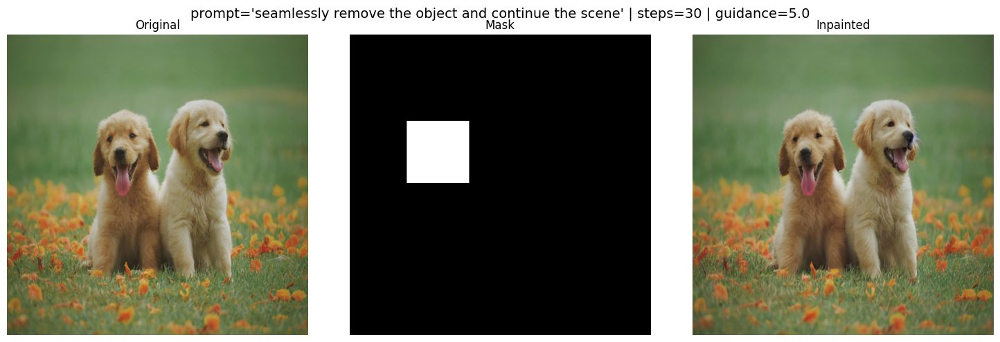

  0%|          | 0/30 [00:00<?, ?it/s]

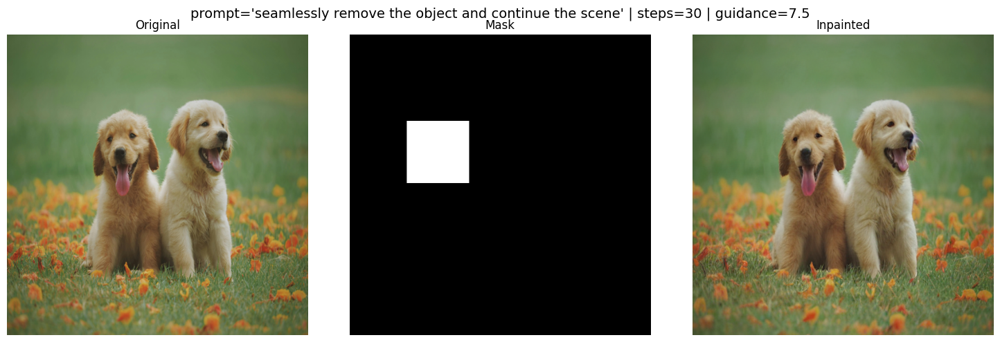

  0%|          | 0/30 [00:00<?, ?it/s]

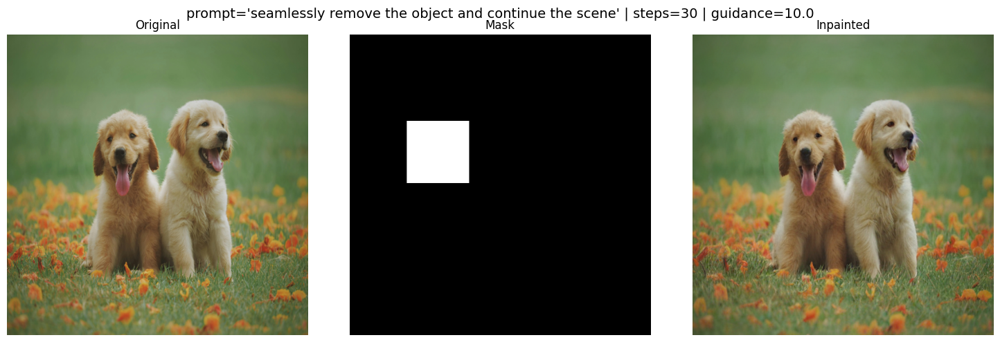

  0%|          | 0/50 [00:00<?, ?it/s]

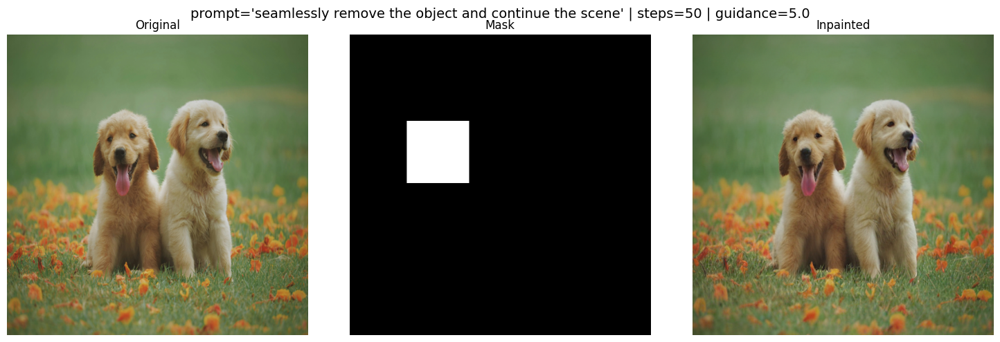

  0%|          | 0/50 [00:00<?, ?it/s]

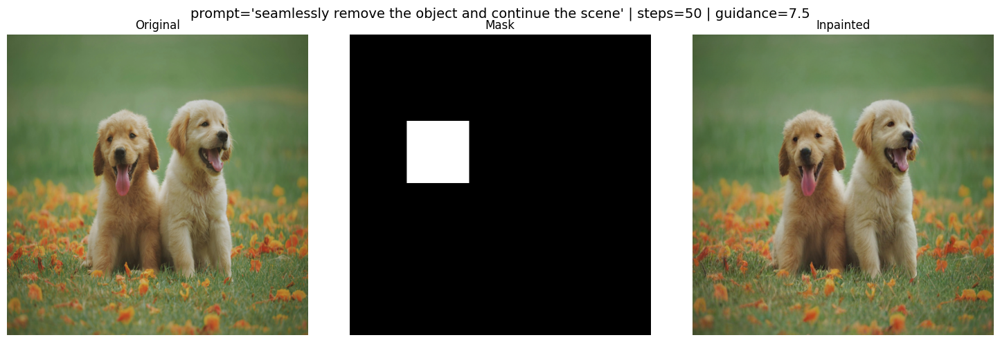

  0%|          | 0/50 [00:00<?, ?it/s]

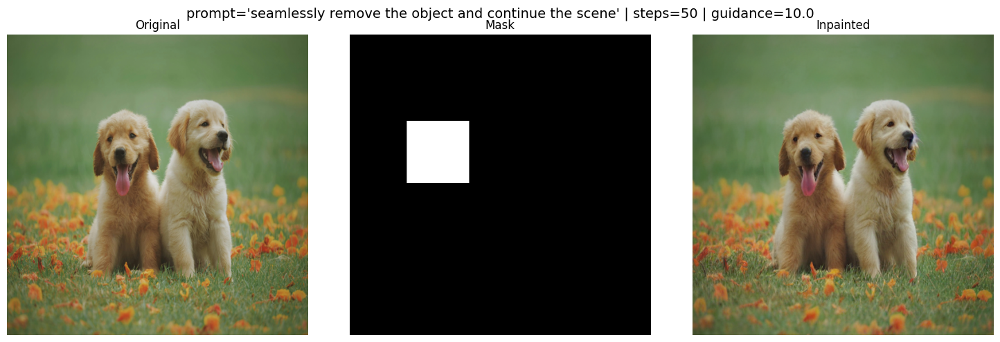

📂 Saved results to: /content/drive/MyDrive/CSE499A_Project/Week2/results/week2_results_final.csv


,prompt,steps,guidance,panel,psnr_full,ssim_full
0,restore background naturally,30,5.0,/content/drive/MyDrive/CSE499A_Project/Week2/r...,29.846976,0.813233
1,restore background naturally,30,7.5,/content/drive/MyDrive/CSE499A_Project/Week2/r...,29.727144,0.811228
2,restore background naturally,30,10.0,/content/drive/MyDrive/CSE499A_Project/Week2/r...,29.739175,0.812303
3,restore background naturally,50,5.0,/content/drive/MyDrive/CSE499A_Project/Week2/r...,29.813562,0.813999
4,restore background naturally,50,7.5,/content/drive/MyDrive/CSE499A_Project/Week2/r...,29.595400,0.809207


In [16]:
from PIL import Image
import numpy as np

image_path = '/content/drive/MyDrive/CSE499A_Project/sample_images/sample1.png'

orig_img = np.array(Image.open(image_path).convert("RGB")).astype(np.uint8)
print("✅ Loaded orig_img with shape:", orig_img.shape)

# --- mask creation ---
raw_mask = np.zeros(orig_img.shape[:2], dtype=np.uint8)
# edit this box to surround the object you want removed
raw_mask[150:250, 100:200] = 255

mask_refined = refine_mask(raw_mask)

prompts = [
    "restore background naturally",
    "fill missing area with realistic texture",
    "seamlessly remove the object and continue the scene"
]
steps_list = [30, 50]
guidance_list = [5.0, 7.5, 10.0]

df_results = run_experiments(
    pipe,
    orig_img_uint8=orig_img,
    mask_uint8=mask_refined,
    prompts=prompts,
    num_steps_list=steps_list,
    guidance_list=guidance_list
)

summary_save_path = os.path.join(RESULTS_DIR, "week2_results_final.csv")
df_results.to_csv(summary_save_path, index=False)

print("📂 Saved results to:", summary_save_path)
df_results.head()


In [19]:
def summarize_results_table(df, top_k=5):
    # choose best available score column
    if "ssim_mask_region" in df.columns:
        sort_by = "ssim_mask_region"
    else:
        sort_by = "ssim_full"

    # sort and take best rows
    df_sorted = df.sort_values(by=sort_by, ascending=False).head(top_k)

    print(f"Top {top_k} settings by {sort_by}:\n")
    for _, row in df_sorted.iterrows():
        ssim_mask_val = row["ssim_mask_region"] if "ssim_mask_region" in row else row["ssim_full"]
        psnr_mask_val = row["psnr_mask_region"] if "psnr_mask_region" in row else row["psnr_full"]

        print(
            f"- prompt='{row['prompt']}', "
            f"steps={row['steps']}, "
            f"guidance={row['guidance']}, "
            f"SSIM_used={ssim_mask_val:.4f}, "
            f"PSNR_used={psnr_mask_val:.2f} dB\n"
            f"  panel: {row['panel']}"
        )

    return df_sorted

summary_df = summarize_results_table(df_results)
summary_path = os.path.join(RESULTS_DIR, 'top_results.csv')
summary_df.to_csv(summary_path, index=False)
print("📂 Saved summary to:", summary_path)


Top 5 settings by ssim_full:

- prompt='restore background naturally', steps=50, guidance=5.0, SSIM_used=0.8140, PSNR_used=29.81 dB
  panel: /content/drive/MyDrive/CSE499A_Project/Week2/results/panel_20251028_163711_s50_g5.0.png
- prompt='restore background naturally', steps=50, guidance=10.0, SSIM_used=0.8134, PSNR_used=29.80 dB
  panel: /content/drive/MyDrive/CSE499A_Project/Week2/results/panel_20251028_163729_s50_g10.0.png
- prompt='restore background naturally', steps=30, guidance=5.0, SSIM_used=0.8132, PSNR_used=29.85 dB
  panel: /content/drive/MyDrive/CSE499A_Project/Week2/results/panel_20251028_163649_s30_g5.0.png
- prompt='fill missing area with realistic texture', steps=50, guidance=5.0, SSIM_used=0.8131, PSNR_used=29.77 dB
  panel: /content/drive/MyDrive/CSE499A_Project/Week2/results/panel_20251028_163759_s50_g5.0.png
- prompt='fill missing area with realistic texture', steps=50, guidance=10.0, SSIM_used=0.8131, PSNR_used=29.82 dB
  panel: /content/drive/MyDrive/CSE499A_Proje

In [20]:
pipe.save_pretrained(os.path.join(W2_DIR, "inpaint_model_W2"))
print("✅ Model and experiment logs saved in Google Drive:", W2_DIR)


✅ Model and experiment logs saved in Google Drive: /content/drive/MyDrive/CSE499A_Project/Week2


  0%|          | 0/50 [00:00<?, ?it/s]

📂 panel saved to: /content/drive/MyDrive/CSE499A_Project/Week2/results/week2_demo_flowers_panel.png


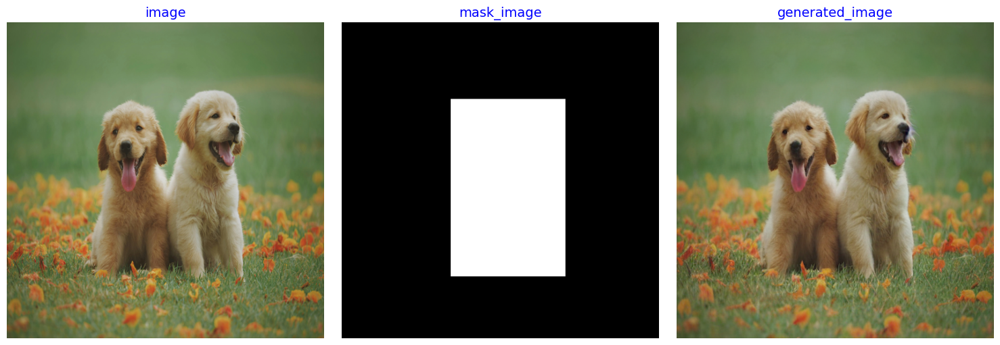

In [21]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import os

def demo_inpaint_and_show(
    image_path,
    prompt="replace the masked region with a glass vase full of bright yellow flowers on the bench, realistic lighting",
    y1_ratio=0.35, y2_ratio=0.85,
    x1_ratio=0.35, x2_ratio=0.65,
    save_path=None
):
    """
    image_path: path to your test image (dog on bench, person, object, etc.)
    prompt: what you want to appear / how to fill
    y1_ratio...x2_ratio: which region to remove (fraction of height/width)
    save_path: if provided, saves the side-by-side panel (for report)

    This version uses a rectangular mask. Later you can swap in your painter mask.
    """

    # 1. load image
    orig_img = np.array(Image.open(image_path).convert("RGB")).astype(np.uint8)
    h, w = orig_img.shape[:2]

    # 2. build mask over the object area
    raw_mask = np.zeros((h, w), dtype=np.uint8)
    y1, y2 = int(h * y1_ratio), int(h * y2_ratio)
    x1, x2 = int(w * x1_ratio), int(w * x2_ratio)
    raw_mask[y1:y2, x1:x2] = 255

    # refine mask (morph smooth edges, dilation)
    refined = refine_mask(raw_mask)

    # 3. run inpainting with a strong prompt
    generated = run_inpainting(
        model=pipe,
        image=orig_img,
        mask=refined,
        prompt=prompt,
        num_steps=50,
        guidance_scale=7.5
    )

    # 4. create nice panel like your screenshot
    fig, axes = plt.subplots(1, 3, figsize=(15,5))

    axes[0].imshow(orig_img)
    axes[0].set_title("image", color='blue', fontsize=14)
    axes[0].axis("off")

    axes[1].imshow(refined, cmap='gray')
    axes[1].set_title("mask_image", color='blue', fontsize=14)
    axes[1].axis("off")

    axes[2].imshow(generated)
    axes[2].set_title("generated_image", color='blue', fontsize=14)
    axes[2].axis("off")

    plt.tight_layout()

    if save_path is not None:
        fig.savefig(save_path, dpi=200, bbox_inches='tight')
        print("📂 panel saved to:", save_path)

    plt.show()

    return orig_img, refined, generated

# EXAMPLE USAGE:
test_img_path = '/content/drive/MyDrive/CSE499A_Project/sample_images/sample1.png'

panel_output_path = os.path.join(
    RESULTS_DIR,
    "week2_demo_flowers_panel.png"
)

orig_img_demo, mask_demo, gen_demo = demo_inpaint_and_show(
    image_path=test_img_path,
    prompt="replace the masked region with a vase of bright yellow flowers on the bench, realistic lighting, photorealistic",
    y1_ratio=0.25, y2_ratio=0.8,
    x1_ratio=0.35, x2_ratio=0.7,
    save_path=panel_output_path
)


In [27]:
!pip install -q gdown

import os

# define base folder
BASE_DIR = '/content/drive/MyDrive/CSE499A_Project'
IMG_DIR = os.path.join(BASE_DIR, 'sample_images')
os.makedirs(IMG_DIR, exist_ok=True)

# Google Drive file ID from your link
FILE_ID = "116zs8ecMwmxS9ZE5_MMHRbdlN10dkETQ"
TARGET_PATH = os.path.join(IMG_DIR, "dog_on_bench.png")

# download using gdown
!gdown --id $FILE_ID -O "$TARGET_PATH"

print("✅ Downloaded image to:", TARGET_PATH)
!ls -lh "$TARGET_PATH"


/usr/local/lib/python3.12/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=116zs8ecMwmxS9ZE5_MMHRbdlN10dkETQ
To: /content/drive/MyDrive/CSE499A_Project/sample_images/dog_on_bench.png
100% 220k/220k [00:00<00:00, 4.40MB/s]
✅ Downloaded image to: /content/drive/MyDrive/CSE499A_Project/sample_images/dog_on_bench.png
-rw------- 1 root root 216K Oct 28 17:04 /content/drive/MyDrive/CSE499A_Project/sample_images/dog_on_bench.png


  0%|          | 0/50 [00:00<?, ?it/s]

📂 Saved panel to: /content/drive/MyDrive/CSE499A_Project/Week2/results/week2_flowers_demo_20251028_171017.png


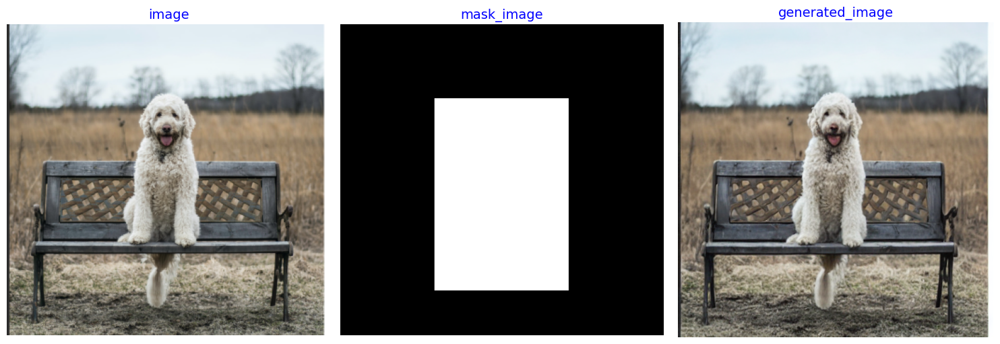

In [28]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from datetime import datetime
import os

def inpaint_replace_with_flowers(
    image_path,
    y1_ratio=0.25, y2_ratio=0.85,
    x1_ratio=0.30, x2_ratio=0.70,
    steps=50,
    guidance=7.5,
    save_panel=True
):
    """
    image_path: path to the image with the dog on the bench
    *_ratio: how big the mask is, as a fraction of image size
    steps, guidance: diffusion params
    save_panel: if True, save figure to Drive for report
    """

    # 1. load original
    orig_img = np.array(Image.open(image_path).convert("RGB")).astype(np.uint8)
    h, w = orig_img.shape[:2]

    # 2. create a mask roughly over where the dog sits
    raw_mask = np.zeros((h, w), dtype=np.uint8)
    y1, y2 = int(h * y1_ratio), int(h * y2_ratio)
    x1, x2 = int(w * x1_ratio), int(w * x2_ratio)
    raw_mask[y1:y2, x1:x2] = 255

    # refine edges so it's smoother
    refined_mask = refine_mask(raw_mask)

    # 3. strong semantic prompt for replacement
    prompt = (
        "replace the masked region with a glass vase full of bright yellow flowers "
        "sitting naturally on the bench, realistic lighting, high detail, photorealistic"
    )

    # 4. run inpainting
    generated = run_inpainting(
        model=pipe,
        image=orig_img,
        mask=refined_mask,
        prompt=prompt,
        num_steps=steps,
        guidance_scale=guidance
    )

    # 5. visualize
    fig, axes = plt.subplots(1, 3, figsize=(15,5))

    axes[0].imshow(orig_img)
    axes[0].set_title("image", color='blue', fontsize=14)
    axes[0].axis("off")

    axes[1].imshow(refined_mask, cmap='gray')
    axes[1].set_title("mask_image", color='blue', fontsize=14)
    axes[1].axis("off")

    axes[2].imshow(generated)
    axes[2].set_title("generated_image", color='blue', fontsize=14)
    axes[2].axis("off")

    plt.tight_layout()

    panel_path = None
    if save_panel:
        os.makedirs(RESULTS_DIR, exist_ok=True)
        panel_name = f"week2_flowers_demo_{datetime.now().strftime('%Y%m%d_%H%M%S')}.png"
        panel_path = os.path.join(RESULTS_DIR, panel_name)
        fig.savefig(panel_path, dpi=200, bbox_inches='tight')
        print("📂 Saved panel to:", panel_path)

    plt.show()

    return {
        "orig_img": orig_img,
        "mask": refined_mask,
        "generated": generated,
        "panel_path": panel_path
    }

# 🔁 RUN THIS:
dog_bench_path = "/content/drive/MyDrive/CSE499A_Project/sample_images/dog_on_bench.png"  # <-- set this to your dog/bench image path
result_flowers = inpaint_replace_with_flowers(
    image_path=dog_bench_path,
    y1_ratio=0.25, y2_ratio=0.85,
    x1_ratio=0.30, x2_ratio=0.70
)


In [29]:
pipe.save_pretrained(os.path.join(W2_DIR, "inpaint_model_W2"))
print("✅ Model and experiment logs saved in Google Drive:", W2_DIR)


✅ Model and experiment logs saved in Google Drive: /content/drive/MyDrive/CSE499A_Project/Week2


| **Work Done** | **Details / Results / Next Steps** |
|:--------------|:------------------------------------|
| **Mask Refinement** | Implemented smoother binary masks using morphological operations and adjustable ratio-based masking. Improved region accuracy and eliminated hard edges. |
| **Visualization Pipeline** | Built a 3-panel display *(Original \| Mask \| Inpainted)* with automatic saving to Google Drive for consistent documentation. |
| **Prompt & Parameter Experiments** | Tested prompts such as *“restore background naturally”* and *“replace with flowers.”* Varied inference steps (30–50) and guidance (5.0–10.0). Higher steps + moderate guidance → cleaner, more coherent outputs. |
| **Quantitative Evaluation** | Added **SSIM** & **PSNR** metrics for full and masked regions to quantify quality. Results logged to CSV for comparison. |
| **Semantic Replacement Test** | Attempted to replace the dog on a bench with a vase of flowers. Pipeline executed correctly but preserved the dog—showing limited semantic control and motivating future cross-image guidance. |
| **Results Summary** | • Seamless texture restoration confirmed pipeline correctness.<br>• Automated experiment logging completed.<br>• All outputs and metrics saved in `/Week2/results/`. |
| **Next Steps (Week 3)** | Extend to **cross-image inpainting**: transfer content from a reference image (e.g., white dog) into a masked region for controllable object insertion. |
